<h1> 1. Introduction Section <h1>
<h2> Discussion on the business problem <h2>
<h2> Description of the Problem and Background<h2>
    <h3>About :<h3>
    <h4> 
        The Battle of Neighborhoods to solve the business problem about the Top cuisines and Specific category in the specific area or the area in which the people wish to visit in Dubai.
        
United Arab Emirates (UAE) state is located on the eastern coast of the Arabic Peninsular, in the southwest corner of the Arabian Gulf. Renowned, worldwide, as a booming centre of international trade and innovation, Dubai has fast become one of the world’s most popular tourist destinations. Only in Dubai can one gaze upon, and travel up, the world’s largest freestanding structure (the Burj Khalifa), shop in both exclusive designer malls and traditional trade souks and indulge in feasts inspired by the flavours of the world while staying in a 7-star hotel!

Dubai is the largest and most populous city in the UAE. There are approximately 2,780,000 residents from over 200 nationalities, plus countless tourists and traders on any given day! The state-of-the-art technology and infrastructure, tax-free living and a strategic location in the centre of the major trading continents, make Dubai the ideal to place to do business. The by-product of this is a dynamic prosperity—the reason that Dubai is one of the leading luxury holiday destinations in the world! Extravagance abounds in this captivating city-state. There is a rich Arabic culture that underpins local life in the city, but all are welcome and encouraged to explore and enjoy Dubai to the absolute fullest! <h4>
    
    
    
<h2> Business Problem: <h2>

<h4>To find out the best restaurants and different cuisines to enjoy varity of the food in the specific location
    
1.Most Popular cuisines in Burduabi Area Karama and

2.Popular Korean restaurants
    
3.Top BBQ restaurants in Dubai
    
4.Best Donut restaurant 
    
5.Popular Coffee Shops <h4>
    
<h2> Data <h2>
    
    
 Description of the data and its sources that will be used to solve the problem
 
 Description of the Data:
 
 Data is picked from the Kaggle dataset which includes the below details :
 
•	Address

•	category

•	id

•	lat

•	lng

•	location

•	name

•	originalId

•	polarity

•	subCategory

•	details

•	reviews


<h2> How the data will be used to solve the problem <h2>
    
•	Using FourSquare API we will find all venues for each neighborhood.

•	Filter out all venues that are nearby by locality.

•	Using aggregative rating for each resturant to find the best places.

•	Visualize the Ranking of neighborhoods using folium library(python)



<h3 >1.1 Read Data <h3>

In [713]:
!pip3 install pandas

You are using pip version 9.0.1, however version 20.0.2 is available.


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [714]:
!pip install --upgrade pip
!pip install jupyter

Requirement already up-to-date: pip in c:\users\home\anaconda3\lib\site-packages (20.0.2)


In [715]:
!pip install pandas

In [716]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [717]:
!pip3 install matplotlib
!pip install --upgrade pip

You are using pip version 9.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


Requirement already up-to-date: pip in c:\users\home\anaconda3\lib\site-packages (20.0.2)


In [718]:
pip install -U scikit-learn scipy matplotlib

Requirement already up-to-date: scikit-learn in c:\users\home\anaconda3\lib\site-packages (0.22.2.post1)
Requirement already up-to-date: scipy in c:\users\home\anaconda3\lib\site-packages (1.4.1)
Requirement already up-to-date: matplotlib in c:\users\home\anaconda3\lib\site-packages (3.2.1)
Note: you may need to restart the kernel to use updated packages.Requirement already satisfied, skipping upgrade: kiwisolver>=1.0.1 in c:\users\home\anaconda3\lib\site-packages (from matplotlib) (1.1.0)



In [719]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


<h3 > Getting to Know Your Data <h3>

In [720]:
df = pd.read_csv("D:\Coursera\Capstone_project\dubai-restaurant.csv")


In [721]:
len(df)

7342

In [722]:
df.shape

(7342, 12)

In [723]:
df.head()

,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
0,Sheikh Zayed Road,restaurant,114414,25.22301489,55.2857995,Dubai,Ibis - World Trade Centre Dubai,4b0587eaf964a5209ea622e3,0,Hotel,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1,Jumeirah Beach Hotel,restaurant,114528,25.141867,55.190518,Dubai,Palm Court,4b0587edf964a5205aa722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
2,Near the Dubai Creek Golf and Yatch Club,restaurant,114560,25.243644,55.332521,Dubai,Cafe Arabesque,4b0587eef964a52098a722e3,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
3,Opp Bur Juman,restaurant,114561,25.2488018,55.31350937,Dubai,Mirchi Indian Restaurant,4b0587eef964a5209aa722e3,0,Bar,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,"Al Qasr Hotel, Madinat Jumeirah",restaurant,114564,25.13125953,55.18415451,Dubai,Al Fayrooz Lounge,4b0587eef964a520a3a722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


<h3 > Displaying Data Types <h3>

In [724]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7342 entries, 0 to 7341
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   address      5594 non-null   object
 1   category     7342 non-null   object
 2   id           7294 non-null   object
 3   lat          7342 non-null   object
 4   lng          7342 non-null   object
 5   location     7342 non-null   object
 6   name         7342 non-null   object
 7   originalId   7342 non-null   object
 8   polarity     7342 non-null   object
 9   subCategory  4354 non-null   object
 10  details      4354 non-null   object
 11  reviews      4354 non-null   object
dtypes: object(12)
memory usage: 688.4+ KB


<h3> Exploring Dataset <h3>

In [725]:
newdf = df[['name','address']]

In [726]:
df["name"].value_counts

<bound method IndexOpsMixin.value_counts of 0                         Ibis - World Trade Centre Dubai
1                                              Palm Court
2                                          Cafe Arabesque
3                                Mirchi Indian Restaurant
4                                       Al Fayrooz Lounge
5                                          Lime Tree Cafe
6                                        Bombay Brasserie
7                                            Tasty Burger
8                                           Savage Garden
9                                              One on One
10                               Wafi Gourmet وافي جورميه
11                             Sakura at Taj Palace Hotel
12                                                Andiamo
13                                                     iZ
14                                             Peppercrab
15                                               Magnolia
16                          

<h3> Cleaning Data <h3>
    
<h3> Invalid Values <h3>
<h4> Removing the Restaurant names which containts numbers <h4>

In [727]:
df[~df.name.str.contains(r'\d')] # \d removes the numbers 0-9


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
0,Sheikh Zayed Road,restaurant,114414,25.22301489,55.2857995,Dubai,Ibis - World Trade Centre Dubai,4b0587eaf964a5209ea622e3,0,Hotel,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1,Jumeirah Beach Hotel,restaurant,114528,25.141867,55.190518,Dubai,Palm Court,4b0587edf964a5205aa722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
2,Near the Dubai Creek Golf and Yatch Club,restaurant,114560,25.243644,55.332521,Dubai,Cafe Arabesque,4b0587eef964a52098a722e3,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
3,Opp Bur Juman,restaurant,114561,25.2488018,55.31350937,Dubai,Mirchi Indian Restaurant,4b0587eef964a5209aa722e3,0,Bar,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,"Al Qasr Hotel, Madinat Jumeirah",restaurant,114564,25.13125953,55.18415451,Dubai,Al Fayrooz Lounge,4b0587eef964a520a3a722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
5,Ibn Buttuta Mall,restaurant,114583,25.0469981,55.12194356,Dubai,Lime Tree Cafe,4b0587eef964a520cba722e3,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
6,Marco Polo Hotel Dubai,restaurant,114611,25.27364682,55.31884469,Dubai,Bombay Brasserie,4b0587eff964a5202ea822e3,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
7,Bank Street,restaurant,114637,25.19015296,55.25626185,Dubai,Tasty Burger,4b0587f0f964a5203ca822e3,0,American Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
8,Al Mina Road,restaurant,114639,25.2420896,55.27657079,Dubai,Savage Garden,4b0587f0f964a52043a822e3,0,South American Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
9,One Shaikh Zayed Road,restaurant,114646,25.2302258,55.28706444,Dubai,One on One,4b0587f0f964a5205ea822e3,0,Bar,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [730]:
df = df[~df.name.str.contains(r'\d')]

In [731]:
newdf = df[['name','address','location','subCategory','lat','lng','reviews']]

In [732]:
len(newdf) # Number of rows once the invalid values removed from the Restaurant Name

4258

In [734]:
newdf.head()

,name,address,location,subCategory,lat,lng,reviews
0,Ibis - World Trade Centre Dubai,Sheikh Zayed Road,Dubai,Hotel,25.22301489,55.2857995,http://tour-pedia.org/api/getReviewsByPlaceId?...
1,Palm Court,Jumeirah Beach Hotel,Dubai,Coffee Shop,25.141867,55.190518,http://tour-pedia.org/api/getReviewsByPlaceId?...
2,Cafe Arabesque,Near the Dubai Creek Golf and Yatch Club,Dubai,Café,25.243644,55.332521,http://tour-pedia.org/api/getReviewsByPlaceId?...
3,Mirchi Indian Restaurant,Opp Bur Juman,Dubai,Bar,25.2488018,55.31350937,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,Al Fayrooz Lounge,"Al Qasr Hotel, Madinat Jumeirah",Dubai,Coffee Shop,25.13125953,55.18415451,http://tour-pedia.org/api/getReviewsByPlaceId?...


<h2> 1.Most Popular cuisines in Burduabi Area Karama area <h2>

In [875]:
newdf6 =df1[df1['address'] == 'Bur Dubai']
newdf6.head()


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
280,Bur Dubai,restaurant,115338,25.26127041,55.29277063,Dubai,Sind Punjab Restaurant,4bbcd673078095218dd3d991,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
832,Bur Dubai,restaurant,116801,25.24881045,55.29646397,Dubai,KFC,4cdb2b265aeda1cd2758bb11,0,Fast Food Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1620,Bur Dubai,restaurant,119186,25.26095724,55.29263027,Dubai,Sangeetha Veg Restraunt,4e42919bd1645b30b56c0031,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1670,Bur Dubai,restaurant,119375,25.24920688,55.30090139,Dubai,Max's Restaurant,4e5d37e1ae60839ea2e1d69f,0,Fried Chicken Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1812,Bur Dubai,restaurant,119914,25.26164923,55.29381258,Dubai,Pinky Restaurant & Sweets,4e947086b8f772c30c71bc28,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


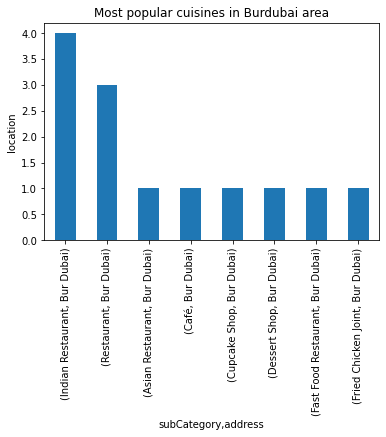

In [876]:
plt.title ("Most popular cuisines in Burdubai area")
plt.xlabel("Type of shop")
plt.ylabel("location")
groups = newdf6.groupby(['subCategory','address']).size().nlargest(10)
groups.plot.bar()
plt.show()

In [877]:
newdf7 =df1[df1['address'] == 'Karama']
newdf7.head()


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
103,Karama,restaurant,114885,25.250372,55.304742,Dubai,Al Hara Cafeteria,4b627f7ef964a520b0492ae3,0,Tea Room,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
236,Karama,restaurant,115212,25.24329968,55.31017766,Dubai,Wadi al Arayesh,4ba3aea6f964a520cc5338e3,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
378,Karama,restaurant,115649,25.2432194,55.30582017,Dubai,Appakadai,4be1b3dfae55a5938d415b62,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
428,Karama,restaurant,115757,25.2402049,55.29780773,Dubai,Treat,4bf6cf17b1a7a593cfbfd65b,0,Indian Restaurant,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
481,Karama,restaurant,115869,25.2396531,55.30704046,Dubai,Exit Café,4c0a5edb340720a1bb3e8693,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


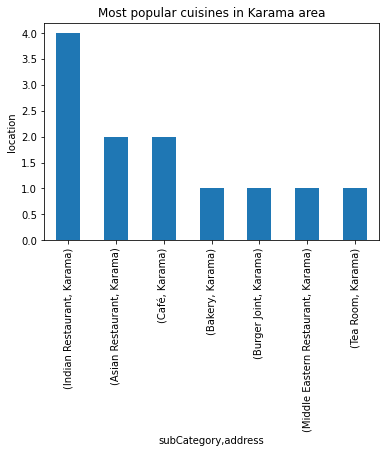

In [879]:
plt.title ("Most popular cuisines in Karama area")
plt.xlabel("Type of shop")
plt.ylabel("location")
groups = newdf7.groupby(['subCategory','address']).size().nlargest(10)
groups.plot.bar()
plt.show()

<h2> 2.Popular Korean restaurants <h2>

In [880]:
newdf1 = df1[['name','address','subCategory','reviews']]
newdf1.head()

,name,address,subCategory,reviews
0,Ibis - World Trade Centre Dubai,Sheikh Zayed Road,Hotel,http://tour-pedia.org/api/getReviewsByPlaceId?...
1,Palm Court,Jumeirah Beach Hotel,Coffee Shop,http://tour-pedia.org/api/getReviewsByPlaceId?...
2,Cafe Arabesque,Near the Dubai Creek Golf and Yatch Club,Café,http://tour-pedia.org/api/getReviewsByPlaceId?...
3,Mirchi Indian Restaurant,Opp Bur Juman,Bar,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,Al Fayrooz Lounge,"Al Qasr Hotel, Madinat Jumeirah",Coffee Shop,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [881]:
newdf2 = newdf1['subCategory'] =='Korean Restaurant'
newdf3 = newdf1[newdf2]
print(newdf3)
len(newdf3)

                                            name                   address  \
242           대장금(Daejangkeum Korean Restaurant)    Kalid Bin Al Waleed Rd   
497                    궁(Kung Korean Restaurant)  Jebel Ali Race Course Rd   
499           Mannaland (만나랜드 Korean Restaurant)                Al Wasl Rd   
556   아리랑 Shogun Korean/Japanese/Thai Restaurant               Al Rigga Rd   
931                     Hyu(휴-Korean Restaurant)              Oud Metha Rd   
1216        The SKY (Korean Restaurant & Bar) 하늘        Golden Tulip Hotel   
1417                   Korean Restaurant Yeh Jan                       NaN   
2020         소반 (Sobahn Korean/Japanese Cuisine)     Sheikh Zayed Rd South   
2161                                     Koreana                 Al Barsha   
2261                                     The sky                       NaN   
3781                               K Pop Chicken          Indigo Icon, JLT   

            subCategory                                        

11

In [887]:
import json
import requests
import itertools    
urls = [ 
'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=115230'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=115911'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=115921'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=116047'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=117054'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=117911'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=118509'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=120572'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=121105'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=121448'
,'http://tour-pedia.org/api/getReviewsByPlaceId?placeId=127322'
]
#print (len(urls))
for url in urls:
    res = requests.get(url)
    input_dict = res.json()
    output_dict = [ search['text'] for search in input_dict ] 
    dump = output_dict
    #d = dict(itertools.zip_longest(*[iter(dump)] * 2, fillvalue=""))
    #d = dump.count('Good')
    #print(d)
    print("The Reviews of the Korean Restaurant : " + json.dumps(dump)) 
    print(url)
            

The values corresponding to key dump : ["This is my favorite Korean restaurant in Dubai.", "Vegatable dumplings are a must! All portions of everything are enormous!", "\ub300\uc7a5\uae08 \uc5c6\uc5b4\uc9c0\uace0 \uc625\ub958\uad00\uc73c\ub85c \ubc14\ub00c\uc5c8\uc5b4\uc694"]
http://tour-pedia.org/api/getReviewsByPlaceId?placeId=115230
The values corresponding to key dump : ["if your are Korean, \uc21c\ub300\uad6d\uc774 \ucd5c\uace0\uc5ec!", "\uc624\uc0bc\ubd88\uace0\uae30\ub3c4 \ub098\uc058\uc9c0\uc54a\uc558\uc74c. \uc7a1\ucc44\ub294 \ubcc4\ub85c... Osambulgogi was pretty good but japchae wasn't.", "\uc721\uac1c\uc7a5\ub3c4 \ub9db\uc788\uc5b4\uc694~^^*", "Even though located a little far, I enjoy hitting this restaurant.", "My boyfriend and I found a cockroach in the food here....", "\ub9cc\ub450\uad6d\uc774 \ub9db\uc788\ub2e4. \uae40\uce58 \ub610\ub294 \uace0\uae30... \uc54c\uc544\uc11c\ub4e4", "I highly recommend their raw meat + raw egg dish if you have the stomach for it.", "Good f

<h2> 3.Top Selling BBQ restaurants in Dubai <h2>

In [894]:
newdf8 =df1[df1['subCategory'] == 'BBQ Joint']
newdf8.head(50)

# Note : Data not sufficient to derive the Top selling restaurant


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
51,Oud Metha Road - Next to Lamcy Plaza,restaurant,114759,25.2346226,55.30929565,Dubai,Barbeque Delights باربيكيو ديلايتس,4b29f5fcf964a52067a424e3,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
152,Dhiyafa Center - Satwa-Dhiyafa roundabout,restaurant,114993,25.23504962,55.27786016,Dubai,Taza BBQ Chicken دجاج الطازج فقيه,4b77c3c9f964a520b3a92ee3,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
362,NaN,restaurant,115587,25.26959889,55.2917395,Dubai,Albandar Restaurant - مطعم البندر,4bd9d6773f01c9b6e55553a5,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
543,شارع جميرا,restaurant,116029,25.14854864,55.19781208,Dubai,Chalet Resturant (Jumeirah) مطعم الشالية,4c2e3db54e132d7f8dd39ddf,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
774,NaN,restaurant,116639,25.243623,55.339474,Dubai,TGI Fridays Garhoud,4cc0905b7dc9a093826a3ff5,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
890,NaN,restaurant,116957,25.068607,55.307392,Dubai,Meeruth Kabab House,4cf29ef0e94254811a3971c5,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
921,NaN,restaurant,117038,25.068309,55.129328,Dubai,The Pit @ DEC Tower,4cffcf012685a35db66ac590,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
950,Nxt to Jabl Al Noor,restaurant,117101,25.2879505,55.36671526,Dubai,BBQ Angaray,4d0cea8e5c46a093c65f0bb4,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1031,Satwa,restaurant,117341,25.23087956,55.27177781,Dubai,Mister Inasal,4d330f0a5c2db60c08c2c76c,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1326,NaN,restaurant,118229,25.06990395,55.13361996,Dubai,Zaara BBQ,4da92bcda86e771ea7054c42,0,BBQ Joint,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [895]:
len(newdf8)

34

<h2> 4. Best Donut shops <h2>

In [896]:
newdf5 =df1[df1['subCategory'] == 'Donut Shop']
newdf5.head()


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
73,Souk Madinat,restaurant,114814,25.1336064,55.18602985,Dubai,Cinnabon,4b5187ccf964a520114f27e3,0,Donut Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
355,Shk zayed,restaurant,115554,25.24657,55.315918,Dubai,Dunkin Donuts,4bd6b2f54e32d13a43f6c280,0,Donut Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
374,E 311 & E66,restaurant,115643,25.13276264,55.38039029,Dubai,Dunkin Donuts,4be13507c1732d7f30755b9a,0,Donut Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
461,Mall of the Emirates,restaurant,115836,25.11907856,55.20274758,Dubai,Krispy Kreme,4c03f40a9a7920a14c91d079,0,Donut Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
695,NaN,restaurant,116414,25.046495,55.24343669,Dubai,Dunkin Donuts,4c946141533aa093bb24bf45,0,Donut Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


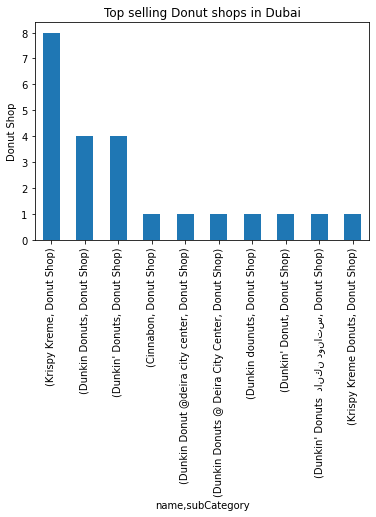

In [897]:
plt.title ("Top selling Donut shops in Dubai")
plt.xlabel("Name of the shop")
plt.ylabel("Donut Shop")
groups = newdf5.groupby(['name','subCategory']).size().nlargest(10)
groups.plot.bar()
plt.show()

<h2> 5.Popular Coffee Shops <h2>

In [898]:
newdf4 =df1[df1['subCategory'] == 'Coffee Shop']
newdf4.head()


,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
1,Jumeirah Beach Hotel,restaurant,114528,25.141867,55.190518,Dubai,Palm Court,4b0587edf964a5205aa722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,"Al Qasr Hotel, Madinat Jumeirah",restaurant,114564,25.13125953,55.18415451,Dubai,Al Fayrooz Lounge,4b0587eef964a520a3a722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
27,Marina Mall - Sheikh Zaid Road,restaurant,114700,25.11011354,55.18896851,Dubai,Starbucks - Marina Mall,4b0809c4f964a520c10223e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
28,The Greens,restaurant,114701,25.09218538,55.17126256,Dubai,Al Dhafra 1,4b086967f964a520460b23e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
33,Sheikh Zayed Road,restaurant,114720,25.14519783,55.22106314,Dubai,Starbucks Shk Zayed Rd,4b0d2964f964a520304423e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


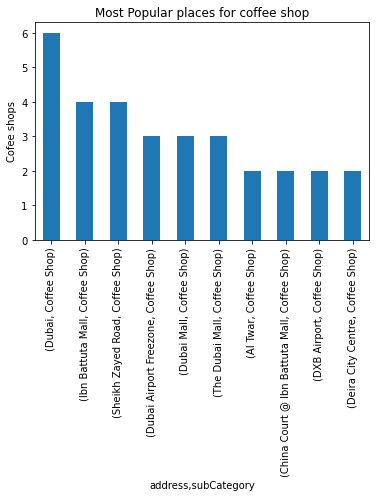

In [899]:
plt.title ("Most Popular places for coffee shop")
plt.xlabel("Locations")
plt.ylabel("Coffee shops")
groups = newdf4.groupby(['address','subCategory']).size().nlargest(10)
groups.plot.bar()
plt.show()

In [735]:
address = 'Dubai, UAE'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of dubai City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of dubai City are 25.0657, 55.1713.


<h3> Map to view the restaurant clusters <h3>

In [736]:
# create map of dubai using latitude and longitude values
map_dubai = folium.Map(location=[latitude, longitude], zoom_start=10)

X = newdf['lat']
Y = newdf['lng']
Z = np.stack((X,Y), axis=1)

kmeans = KMeans(n_clusters=5 ,random_state=0).fit(Z)

clusters = kmeans.labels_colors =['red','green','blue','yellow','orange']


# add markers to map
for lat, lng, location,name in zip(newdf['lat'], newdf['lng'], newdf['location'],newdf['name']):
    label = '{}, {}'.format(name, location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [float(lat),float(lng)],
        radius=5,
        tiles='Stamen Toner',
        popup=label,
        color='blue',
        fill=True,
        fill_color='#FFBA00',
        fill_opacity=0.7).add_to(map_dubai)  
    
map_dubai

<h3>Top 10 locations which has more Restaurants to visit <h3>

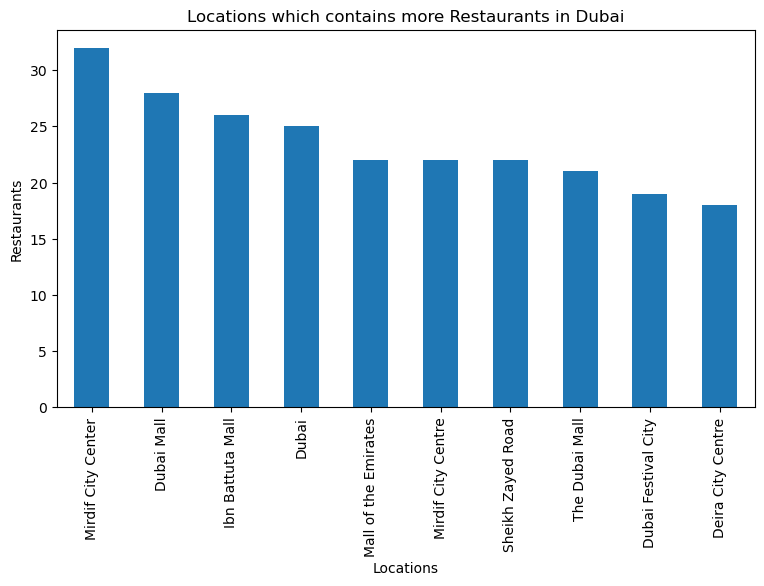

In [739]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi=100)
plt.title ("Locations which contains more Restaurants in Dubai")

g.plot.bar()

plt.xlabel("Locations")
plt.ylabel("Restaurants")
plt.show()

<h3> Based on the above plot Top most place is Mirdiff city Center and  simplify the above map and segment and cluster only the neighborhoods in Mirdif City Center. So let's slice the original dataframe and create a new dataframe of the new data. <h3>

In [703]:
mirdif_data = newdf[newdf['address'] == 'Mirdif City Center']
mirdif_data.head()

,name,address,location,subCategory,lat,lng,reviews
253,Caffe' NERO كافيه نيرو,Mirdif City Center,Dubai,Café,25.21472577,55.40735722,http://tour-pedia.org/api/getReviewsByPlaceId?...
272,Marble Slab,Mirdif City Center,Dubai,Ice Cream Shop,25.21275072,55.41270928,http://tour-pedia.org/api/getReviewsByPlaceId?...
339,Mango Tree,Mirdif City Center,Dubai,Thai Restaurant,25.16016685,55.40926024,http://tour-pedia.org/api/getReviewsByPlaceId?...
383,Chili's,Mirdif City Center,Dubai,Eastern European Restaurant,25.21430559,55.38844454,http://tour-pedia.org/api/getReviewsByPlaceId?...
404,Caribou Coffee | مقهى كاريبو,Mirdif City Center,Dubai,Coffee Shop,25.21574894,55.40879533,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [740]:
address = 'Mirdif City Center'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Mirdif are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Mirdif are 25.21598125, 55.40746704313602.


In [742]:
mirdif_dubai = folium.Map(location=[25.21598125, 55.40746704313602], zoom_start=20)

X = newdf['lat']
Y = newdf['lng']
Z = np.stack((X,Y), axis=1)

kmeans = KMeans(n_clusters=5 ,random_state=0).fit(Z)

clusters = kmeans.labels_colors =['red','green','blue','yellow','orange']


# add markers to map
for lat, lng, location,name in zip(newdf['lat'], newdf['lng'], newdf['location'],newdf['name']):
    label = '{}, {}'.format(name, location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [float(lat),float(lng)],
        radius=5,
        tiles='Stamen Toner',
        popup=label,
        color='blue',
        fill=True,
        fill_color='#FFBA00',
        fill_opacity=0.7).add_to(mirdif_dubai)  
    
mirdif_dubai

In [441]:
df1 = pd.read_csv("D:\Coursera\Capstone_project\dubai-restaurant.csv")
df1.head()

,address,category,id,lat,lng,location,name,originalId,polarity,subCategory,details,reviews
0,Sheikh Zayed Road,restaurant,114414,25.22301489,55.2857995,Dubai,Ibis - World Trade Centre Dubai,4b0587eaf964a5209ea622e3,0,Hotel,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
1,Jumeirah Beach Hotel,restaurant,114528,25.141867,55.190518,Dubai,Palm Court,4b0587edf964a5205aa722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
2,Near the Dubai Creek Golf and Yatch Club,restaurant,114560,25.243644,55.332521,Dubai,Cafe Arabesque,4b0587eef964a52098a722e3,0,Café,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
3,Opp Bur Juman,restaurant,114561,25.2488018,55.31350937,Dubai,Mirchi Indian Restaurant,4b0587eef964a5209aa722e3,0,Bar,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...
4,"Al Qasr Hotel, Madinat Jumeirah",restaurant,114564,25.13125953,55.18415451,Dubai,Al Fayrooz Lounge,4b0587eef964a520a3a722e3,0,Coffee Shop,http://tour-pedia.org/api/getPlaceDetails?id=1...,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [743]:
mirdif_data = newdf[newdf['address'] == 'Mirdif City Center']
mirdif_data.head()

,name,address,location,subCategory,lat,lng,reviews
253,Caffe' NERO كافيه نيرو,Mirdif City Center,Dubai,Café,25.21472577,55.40735722,http://tour-pedia.org/api/getReviewsByPlaceId?...
272,Marble Slab,Mirdif City Center,Dubai,Ice Cream Shop,25.21275072,55.41270928,http://tour-pedia.org/api/getReviewsByPlaceId?...
339,Mango Tree,Mirdif City Center,Dubai,Thai Restaurant,25.16016685,55.40926024,http://tour-pedia.org/api/getReviewsByPlaceId?...
383,Chili's,Mirdif City Center,Dubai,Eastern European Restaurant,25.21430559,55.38844454,http://tour-pedia.org/api/getReviewsByPlaceId?...
404,Caribou Coffee | مقهى كاريبو,Mirdif City Center,Dubai,Coffee Shop,25.21574894,55.40879533,http://tour-pedia.org/api/getReviewsByPlaceId?...


In [744]:
CLIENT_ID = 'SPNAJ0RKMSD3UXALBEXB0GAHGJNMFEV0J55E4EAHT4YHH4WP'
CLIENT_SECRET = 'OUGHASTBIJTODM0H3F2BFTIF01KT314I5GOKS0TWORNOLCZQ' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: SPNAJ0RKMSD3UXALBEXB0GAHGJNMFEV0J55E4EAHT4YHH4WP
CLIENT_SECRET:OUGHASTBIJTODM0H3F2BFTIF01KT314I5GOKS0TWORNOLCZQ


In [753]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            )
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)
                                                  

In [755]:
mirdif_venues = getNearbyVenues(names=mirdif_data['name'],
                                   latitudes=mirdif_data['lat'],
                                   longitudes=mirdif_data['lng']
                                  )

Caffe' NERO كافيه نيرو
Marble Slab
Mango Tree
Chili's
Caribou Coffee | مقهى كاريبو
Costa @ Mirdif City Center
Pinkberry
Sugar Daddy's
Zafran
Sukiyaki
Cold Stone Creamery
Paul Cafe
Pars
Jimmy The Greek
Haagen Dazs هاجن داز
GBK
Chocolate Bar شوكلت بار
Love Life Boost
McDonald's
Pars Restuarant مطعم بارس
edo - japanese mochi
Leila ليلى
Chinese Palace Restaurant
Krispy Kreme
Abdelwahab عبدالوهاب
Arabesq - أرابيسك
daily fresh


KeyError: 'groups'

In [757]:
print(mirdif_venues.shape)
mirdif_venues.head()

(837, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Mirdif City Center,25.21472577,55.40735722,City Centre Mirdif (مردف سيتي سنتر),25.216264,55.407666,Shopping Mall
1,Mirdif City Center,25.21472577,55.40735722,VOX Cinemas (ڤوكس سينما),25.214773,55.407198,Multiplex
2,Mirdif City Center,25.21472577,55.40735722,P.F. Chang's (بي إف تشانغز),25.216313,55.408616,Chinese Restaurant
3,Mirdif City Center,25.21472577,55.40735722,iFly Dubai,25.214751,55.408801,Theme Park Ride / Attraction
4,Mirdif City Center,25.21472577,55.40735722,VOX GOLD,25.214771,55.406673,Movie Theater


In [759]:
mirdif_venues.groupby('Venue').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Latitude,Venue Longitude,Venue Category
Venue,,,,,,
% ARABICA,25,25,25,25,25,25
1847,24,24,24,24,24,24
Abd El Wahab (عبد الوهاب),2,2,2,2,2,2
Adidas Originals,2,2,2,2,2,2
Ahla Allayali Coffee Shop,1,1,1,1,1,1
Al Arrab Resturant,1,1,1,1,1,1
Al Maaref Sports Hall,1,1,1,1,1,1
Al7reer ( silk),1,1,1,1,1,1
Bab Al Shams Desert Resort & Spa,1,1,1,1,1,1


In [760]:
print('There are {} uniques categories.'.format(len(mirdif_venues['Venue Category'].unique())))

There are 57 uniques categories.


In [761]:
mirdif_onehot = pd.get_dummies(mirdif_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
mirdif_onehot['Neighborhood'] = mirdif_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [mirdif_onehot.columns[-1]] + list(mirdif_onehot.columns[:-1])
mirdif_onehot = mirdif_onehot[fixed_columns]

mirdif_onehot.head()

,Neighborhood,Accessories Store,Airport,American Restaurant,Arcade,Asian Restaurant,Badminton Court,Bakery,Beach,Big Box Store,Bookstore,Bowling Alley,Burger Joint,Bus Station,Café,Chinese Restaurant,Clothing Store,Coffee Shop,Cosmetics Shop,Department Store,Donut Shop,Fast Food Restaurant,Food Court,Frozen Yogurt Shop,Furniture / Home Store,Gift Shop,Grocery Store,Gym,Gymnastics Gym,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Lebanese Restaurant,Lingerie Store,Middle Eastern Restaurant,Movie Theater,Multiplex,Pakistani Restaurant,Parking,Pet Store,Pharmacy,Pizza Place,Portuguese Restaurant,Restaurant,Salad Place,Sandwich Place,Seafood Restaurant,Shoe Store,Shopping Mall,Spa,Sporting Goods Shop,Sri Lankan Restaurant,Steakhouse,Supermarket,Tex-Mex Restaurant,Theme Park Ride / Attraction
0,Mirdif City Center,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,Mirdif City Center,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Mirdif City Center,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Mirdif City Center,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,Mirdif City Center,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [762]:
mirdif_onehot.shape

(837, 58)

In [763]:
mirdif_grouped = mirdif_onehot.groupby('Neighborhood').mean().reset_index()
mirdif_grouped

,Neighborhood,Accessories Store,Airport,American Restaurant,Arcade,Asian Restaurant,Badminton Court,Bakery,Beach,Big Box Store,Bookstore,Bowling Alley,Burger Joint,Bus Station,Café,Chinese Restaurant,Clothing Store,Coffee Shop,Cosmetics Shop,Department Store,Donut Shop,Fast Food Restaurant,Food Court,Frozen Yogurt Shop,Furniture / Home Store,Gift Shop,Grocery Store,Gym,Gymnastics Gym,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Lebanese Restaurant,Lingerie Store,Middle Eastern Restaurant,Movie Theater,Multiplex,Pakistani Restaurant,Parking,Pet Store,Pharmacy,Pizza Place,Portuguese Restaurant,Restaurant,Salad Place,Sandwich Place,Seafood Restaurant,Shoe Store,Shopping Mall,Spa,Sporting Goods Shop,Sri Lankan Restaurant,Steakhouse,Supermarket,Tex-Mex Restaurant,Theme Park Ride / Attraction
0,Mirdif City Center,0.001195,0.001195,0.028674,0.016726,0.002389,0.001195,0.033453,0.001195,0.001195,0.028674,0.031063,0.014337,0.001195,0.063321,0.031063,0.032258,0.117085,0.035842,0.001195,0.002389,0.007168,0.003584,0.028674,0.009558,0.026284,0.001195,0.033453,0.001195,0.001195,0.003584,0.023895,0.059737,0.001195,0.029869,0.002389,0.003584,0.072879,0.028674,0.001195,0.001195,0.001195,0.001195,0.003584,0.001195,0.031063,0.002389,0.003584,0.013142,0.003584,0.028674,0.028674,0.031063,0.001195,0.002389,0.027479,0.002389,0.031063


In [764]:
mirdif_grouped.shape

(1, 58)

In [765]:
num_top_venues = 5

for hood in mirdif_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = mirdif_grouped[mirdif_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Mirdif City Center----
               venue  freq
0        Coffee Shop  0.12
1      Movie Theater  0.07
2  Indian Restaurant  0.06
3               Café  0.06
4     Cosmetics Shop  0.04




In [766]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [778]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = mirdif_grouped['Neighborhood']

for ind in np.arange(mirdif_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(mirdif_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Mirdif City Center,Coffee Shop,Movie Theater,Café,Indian Restaurant,Cosmetics Shop,Gym,Bakery,Clothing Store,Restaurant,Chinese Restaurant
